# Multiple Linear Regression

In [55]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

In [56]:
housing_df = pd.read_csv('https://raw.githubusercontent.com/UrielBender/BigData/master/DataSets/housing_complete_data.csv')

# EDA

In [57]:
housing_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

In [58]:
housing_df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [59]:
# check for missing values
housing_df.isna().any(axis=1).sum()

0

In [60]:
# Remove non informative data
pd.unique(housing_df.date.str[:4])

array(['2014', '2015'], dtype=object)

In [61]:
housing_df.drop(['id', 'date', 'lat', 'long'], axis=1, inplace=True)

In [62]:
# adding House age feature
from datetime import datetime as dt

curr_year = dt.now().year
housing_df['age'] = curr_year - housing_df.yr_built
housing_df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15,age
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,1340,5650,67
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,1690,7639,71
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,2720,8062,89
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,1360,5000,57
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,1800,7503,35


In [63]:
# how old is the renovation
housing_df['ren_was_before'] = curr_year - housing_df.yr_renovated
housing_df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15,age,ren_was_before
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,1340,5650,67,2022
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,1690,7639,71,31
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,2720,8062,89,2022
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,1360,5000,57,2022
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,1800,7503,35,2022


In [64]:
housing_df.ren_was_before = np.where(housing_df.ren_was_before == curr_year, housing_df.age, housing_df.ren_was_before)

In [65]:
housing_df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15,age,ren_was_before
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,1340,5650,67,67
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,1690,7639,71,31
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,2720,8062,89,89
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,1360,5000,57,57
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,1800,7503,35,35


In [66]:
# scacle the price to units of 1000$
housing_df['price_K'] = housing_df.price / 1000
housing_df.head(3)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15,age,ren_was_before,price_K
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,1340,5650,67,67,221.9
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,1690,7639,71,31,538.0
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,2720,8062,89,89,180.0


In [67]:
# drop all irrelevant features
housing_df.drop(['yr_built', 'yr_renovated', 'price'],axis=1,inplace=True)
housing_df.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,zipcode,sqft_living15,sqft_lot15,age,ren_was_before,price_K
0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,98178,1340,5650,67,67,221.9
1,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,98125,1690,7639,71,31,538.0
2,2,1.00,770,10000,1.0,0,0,3,6,770,0,98028,2720,8062,89,89,180.0
3,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,98136,1360,5000,57,57,604.0
4,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,98074,1800,7503,35,35,510.0


In [68]:
housing_df.describe()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,zipcode,sqft_living15,sqft_lot15,age,ren_was_before,price_K
count,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,98077.939805,1986.552492,12768.455652,50.994864,48.613982,540.088142
std,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,53.505026,685.391304,27304.179631,29.373411,28.806854,367.127196
min,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,98001.000000,399.000000,651.000000,7.000000,7.000000,75.000000
25%,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,98033.000000,1490.000000,5100.000000,25.000000,23.000000,321.950000
50%,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,98065.000000,1840.000000,7620.000000,47.000000,45.000000,450.000000
75%,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,98118.000000,2360.000000,10083.000000,71.000000,68.000000,645.000000
max,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,98199.000000,6210.000000,871200.000000,122.000000,122.000000,7700.000000


## Scale the DF
#### For plotting puposes only

In [69]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaled_df = pd.DataFrame(scaler.fit_transform(housing_df), columns=housing_df.columns)
scaled_df

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,zipcode,sqft_living15,sqft_lot15,age,ren_was_before,price_K
0,0.090909,0.12500,0.067170,0.003108,0.0,0.0,0.0,0.5,0.500000,0.097588,0.000000,0.893939,0.161934,0.005742,0.521739,0.521739,0.019266
1,0.090909,0.28125,0.172075,0.004072,0.4,0.0,0.0,0.5,0.500000,0.206140,0.082988,0.626263,0.222165,0.008027,0.556522,0.208696,0.060721
2,0.060606,0.12500,0.036226,0.005743,0.0,0.0,0.0,0.5,0.416667,0.052632,0.000000,0.136364,0.399415,0.008513,0.713043,0.713043,0.013770
3,0.121212,0.37500,0.126038,0.002714,0.0,0.0,0.0,1.0,0.500000,0.083333,0.188797,0.681818,0.165376,0.004996,0.434783,0.434783,0.069377
4,0.090909,0.25000,0.104906,0.004579,0.0,0.0,0.0,0.5,0.583333,0.152412,0.000000,0.368687,0.241094,0.007871,0.243478,0.243478,0.057049
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,0.090909,0.31250,0.093585,0.000370,0.8,0.0,0.0,0.5,0.583333,0.135965,0.000000,0.515152,0.194631,0.000986,0.052174,0.052174,0.037377
21609,0.121212,0.31250,0.152453,0.003206,0.4,0.0,0.0,0.5,0.583333,0.221491,0.000000,0.732323,0.246257,0.007523,0.008696,0.008696,0.042623
21610,0.060606,0.09375,0.055094,0.000503,0.4,0.0,0.0,0.5,0.500000,0.080044,0.000000,0.722222,0.106866,0.001558,0.052174,0.052174,0.042898
21611,0.090909,0.31250,0.098868,0.001132,0.4,0.0,0.0,0.5,0.583333,0.143640,0.000000,0.131313,0.173980,0.000731,0.095652,0.095652,0.042623


## Detect Outliers

In [70]:
c = ['hsl('+str(h)+',50%'+',50%)' for h in np.linspace(0,360, len(scaled_df.columns))]

fig = go.Figure()
fig.add_traces(data=[go.Box(y=scaled_df.iloc[:,i], 
                           marker_color=c[i], 
                           name=scaled_df.columns[i]) 
                           for i in range(len(scaled_df.columns))])

# Inference:
# Outliers are important in this dataset. 
# Buy they hold extra values that might reflect the prediction of our model and we should consider removing them.
# The floors, zipcode and age features have no outliers

In [71]:
corr_df = housing_df.corr()
corr_df

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,zipcode,sqft_living15,sqft_lot15,age,ren_was_before,price_K
bedrooms,1.000000,0.515884,0.576671,0.031703,0.175429,-0.006582,0.079532,0.028472,0.356967,0.477600,0.303093,-0.152668,0.391638,0.029244,-0.154178,-0.165506,0.308350
bathrooms,0.515884,1.000000,0.754665,0.087740,0.500653,0.063744,0.187737,-0.124982,0.664983,0.685342,0.283770,-0.203866,0.568634,0.087175,-0.506019,-0.537164,0.525138
sqft_living,0.576671,0.754665,1.000000,0.172826,0.353949,0.103818,0.284611,-0.058753,0.762704,0.876597,0.435043,-0.199430,0.756420,0.183286,-0.318049,-0.343745,0.702035
sqft_lot,0.031703,0.087740,0.172826,1.000000,-0.005201,0.021604,0.074710,-0.008958,0.113621,0.183512,0.015286,-0.129574,0.144608,0.718557,-0.053080,-0.052911,0.089661
floors,0.175429,0.500653,0.353949,-0.005201,1.000000,0.023698,0.029444,-0.263768,0.458183,0.523885,-0.245705,-0.059121,0.279885,-0.011269,-0.489319,-0.505408,0.256794
waterfront,-0.006582,0.063744,0.103818,0.021604,0.023698,1.000000,0.401857,0.016653,0.082775,0.072075,0.080588,0.030285,0.086463,0.030703,0.026161,0.000537,0.266369
view,0.079532,0.187737,0.284611,0.074710,0.029444,0.401857,1.000000,0.045990,0.251321,0.167649,0.276947,0.084827,0.280439,0.072575,0.053440,0.018264,0.397293
condition,0.028472,-0.124982,-0.058753,-0.008958,-0.263768,0.016653,0.045990,1.000000,-0.144674,-0.158214,0.174105,0.003026,-0.092824,-0.003406,0.361417,0.396358,0.036362
grade,0.356967,0.664983,0.762704,0.113621,0.458183,0.082775,0.251321,-0.144674,1.000000,0.755923,0.168392,-0.184862,0.713202,0.119248,-0.446963,-0.460796,0.667434
sqft_above,0.477600,0.685342,0.876597,0.183512,0.523885,0.072075,0.167649,-0.158214,0.755923,1.000000,-0.051943,-0.261190,0.731870,0.194050,-0.423898,-0.435904,0.605567


In [72]:
fig = go.Figure()
fig.add_traces(go.Heatmap(z=corr_df, x=corr_df.columns, y=corr_df.columns, zmax=1, zmin=-1))
fig.update_layout({'title': 'Features correlation Heatmap'})

# Build the model

In [73]:
corr_df = housing_df.corr()
correlated = corr_df.price_K[abs(corr_df.price_K >= 0.5)].index.tolist()
correlated

['bathrooms', 'sqft_living', 'grade', 'sqft_above', 'sqft_living15', 'price_K']

In [74]:
# Drop the target and set as a list
correlated = correlated[:-1]
correlated

['bathrooms', 'sqft_living', 'grade', 'sqft_above', 'sqft_living15']

In [75]:
correlated

['bathrooms', 'sqft_living', 'grade', 'sqft_above', 'sqft_living15']

In [76]:
# Set x and y
y = housing_df.price_K
X = housing_df[correlated]
X

,bathrooms,sqft_living,grade,sqft_above,sqft_living15
0,1.00,1180,7,1180,1340
1,2.25,2570,7,2170,1690
2,1.00,770,6,770,2720
3,3.00,1960,7,1050,1360
4,2.00,1680,8,1680,1800
...,...,...,...,...,...
21608,2.50,1530,8,1530,1530
21609,2.50,2310,8,2310,1830
21610,0.75,1020,7,1020,1020
21611,2.50,1600,8,1600,1410


In [77]:
# Scatter plot all the features vs the price var
from plotly.subplots import make_subplots
rows = 2
cols = 3
c = ['blue', 'green', 'yellow', 'red', 'orange']
fig = make_subplots(rows=rows, cols=cols, shared_yaxes=True)
count = 0
for i in range(rows):
    for j in range(cols):
        if count < len(X.columns):
            fig.add_trace(go.Scatter(y=y,x=X.iloc[:,count], mode='markers', marker_color=c[count], marker_size=2.5,
                                    name=X.columns[count]), row=i+1,col=j+1)
            fig.update_xaxes(title_text=X.columns[count],row=i+1,col=j+1)
            count += 1

fig.update_layout(height=600, width=900, title_text='Price by features')
fig.show()

# Inference: 
# The scatter that is more adequate to fit a straight line is the 'Price' by 'Living Area'
# This is in accordance with the high correlation between the pair 'Price' and 'Living Area'

In [78]:
# train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=.3,random_state=1234)
train_df = pd.merge(left=X_train,right=y_train,left_index=True,right_index=True)
test_df = pd.merge(left=X_test,right=y_test,left_index=True,right_index=True)
test_df.head(10)

,bathrooms,sqft_living,grade,sqft_above,sqft_living15,price_K
12432,1.75,2030,8,1330,2030,485.0
7793,2.25,2510,8,2510,1870,358.0
13435,2.75,3630,11,3630,4440,716.5
1821,1.00,1660,7,1160,1320,367.5
12449,2.50,2030,8,2030,1780,544.0
2033,1.00,1010,6,750,1450,350.0
11711,2.25,2250,8,1510,2240,750.0
1135,3.00,2940,8,1690,1850,420.0
17540,2.00,1770,7,1630,1640,447.5
10695,2.50,2140,8,2140,2380,545.0


In [79]:
# scale tge sets
from sklearn.preprocessing import StandardScaler

x_train_scaler = StandardScaler()
x_test_scaler = StandardScaler()
y_train_scaler = StandardScaler()
y_test_scaler = StandardScaler()

X_train_scaled = x_train_scaler.fit_transform(X_train)
X_test_scaled = x_test_scaler.fit_transform(X_test)
y_train_scaled = y_train_scaler.fit_transform(pd.DataFrame(y_train))
y_test_scaled = y_test_scaler.fit_transform(pd.DataFrame(y_test))

In [80]:
# Training
from sklearn.linear_model import LinearRegression
lm = LinearRegression()
lm.fit(X_train_scaled, y_train_scaled)

slope = lm.coef_[0]
intercept = lm.intercept_[0]

In [81]:
# Prediction
fitted_scaled_price = lm.predict(X_train_scaled) # returns ndarray

# Inverse the scaler transformation
fitted_price = y_train_scaler.inverse_transform(fitted_scaled_price)

In [82]:
# create pandas series of the results
predicted_train_price = round(pd.Series(fitted_price[:,0], index=y_train.index, name='predicted_train_price'), ndigits=2)
predicted_train_price

15026     371.11
7354      249.26
6051      389.53
4398      379.11
9298      640.30
          ...   
8222     1070.04
9449      904.15
8471      411.50
17048      78.77
1318      412.30
Name: predicted_train_price, Length: 15129, dtype: float64

In [83]:
# Add the results to the DF
train_df = pd.merge(left=train_df, right=predicted_train_price, left_index=True, right_index=True)
train_df.head(10)

,bathrooms,sqft_living,grade,sqft_above,sqft_living15,price_K,predicted_train_price
15026,1.75,1620,7,1620,1560,439.00,371.11
7354,1.00,1400,6,1400,1430,279.90,249.26
6051,1.00,1460,7,1260,1580,312.00,389.53
4398,1.75,1620,7,1620,1890,249.95,379.11
9298,2.50,2030,9,2030,1870,565.00,640.30
5324,2.25,1720,7,1220,1690,210.00,410.60
2369,2.50,2590,10,2590,2800,674.75,868.36
18975,5.50,6630,10,4930,4470,1240.00,1606.60
13089,2.25,2290,8,2290,2170,365.00,590.40
33,1.00,1090,8,1090,1570,535.00,422.06


In [84]:
# Cant plot the linear model because it is 5 dimensional

# Polynomial (Linear) Regression

In [31]:
cars_df = pd.read_csv('https://raw.githubusercontent.com/UrielBender/BigData/master/DataSets/cars93.csv')

In [32]:
cars_df.head()

,mpg,cylinders,engine_power,horsepower,weight,acceleration,year,origin,car_name
0,18.0,8,307.0,130.0,3504,12.0,70,US,"""chevrolet chevelle malibu"""
1,15.0,8,350.0,165.0,3693,11.5,70,US,"""buick skylark 320"""
2,18.0,8,318.0,150.0,3436,11.0,70,US,"""plymouth satellite"""
3,16.0,8,304.0,150.0,3433,12.0,70,US,"""amc rebel sst"""
4,17.0,8,302.0,140.0,3449,10.5,70,US,"""ford torino"""


In [33]:
cars_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   mpg           398 non-null    float64
 1   cylinders     398 non-null    int64  
 2   engine_power  398 non-null    float64
 3   horsepower    392 non-null    float64
 4   weight        398 non-null    int64  
 5   acceleration  398 non-null    float64
 6   year          398 non-null    int64  
 7   origin        398 non-null    object 
 8   car_name      398 non-null    object 
dtypes: float64(4), int64(3), object(2)
memory usage: 28.1+ KB


In [34]:
df = pd.DataFrame(cars_df, columns=['mpg','weight','engine_power','acceleration','origin','year'])
df.head()

,mpg,weight,engine_power,acceleration,origin,year
0,18.0,3504,307.0,12.0,US,70
1,15.0,3693,350.0,11.5,US,70
2,18.0,3436,318.0,11.0,US,70
3,16.0,3433,304.0,12.0,US,70
4,17.0,3449,302.0,10.5,US,70


In [35]:
import seaborn as sns

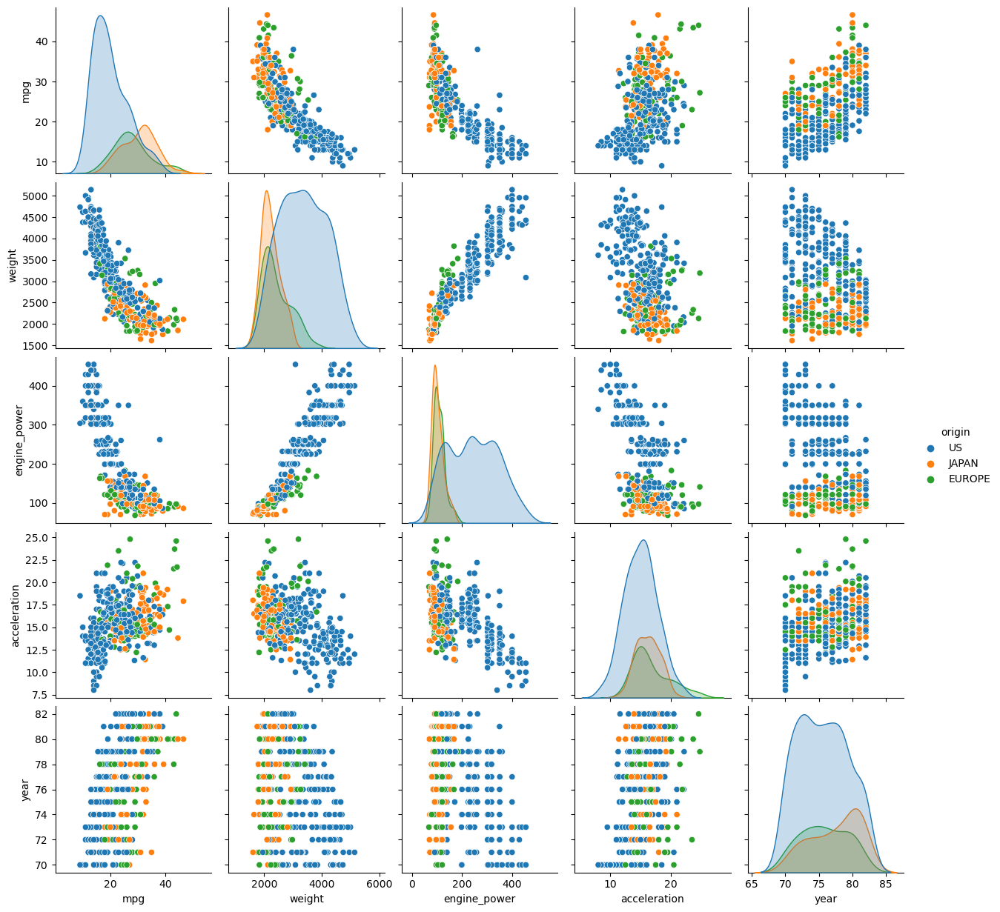

In [36]:
sns.pairplot(df,hue='origin')

In [37]:
corr_df = df.corr()
corr_df

,mpg,weight,engine_power,acceleration,year
mpg,1.000000,-0.831741,-0.804203,0.420289,0.579267
weight,-0.831741,1.000000,0.932824,-0.417457,-0.306564
engine_power,-0.804203,0.932824,1.000000,-0.543684,-0.370164
acceleration,0.420289,-0.417457,-0.543684,1.000000,0.288137
year,0.579267,-0.306564,-0.370164,0.288137,1.000000


In [38]:
X = df[['weight']]
y = df.mpg

In [39]:
# train test split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=.3,random_state=1234)
train_df = pd.merge(left=X_train,right=y_train,left_index=True,right_index=True)
test_df = pd.merge(left=X_test,right=y_test,left_index=True,right_index=True)
test_df.head(10)

,weight,mpg
40,4154,14.0
44,5140,13.0
298,3900,23.0
59,2254,23.0
270,2515,21.1
205,2155,28.0
222,4060,17.0
268,2300,27.2
7,4312,14.0
162,3730,15.0


In [40]:
# scale tge sets

x_train_scaler = StandardScaler()
x_test_scaler = StandardScaler()
y_train_scaler = StandardScaler()
y_test_scaler = StandardScaler()

X_train_scaled = x_train_scaler.fit_transform(X_train)
X_test_scaled = x_test_scaler.fit_transform(X_test)
y_train_scaled = y_train_scaler.fit_transform(pd.DataFrame(y_train))
y_test_scaled = y_test_scaler.fit_transform(pd.DataFrame(y_test))

In [41]:
import matplotlib.pyplot as plt

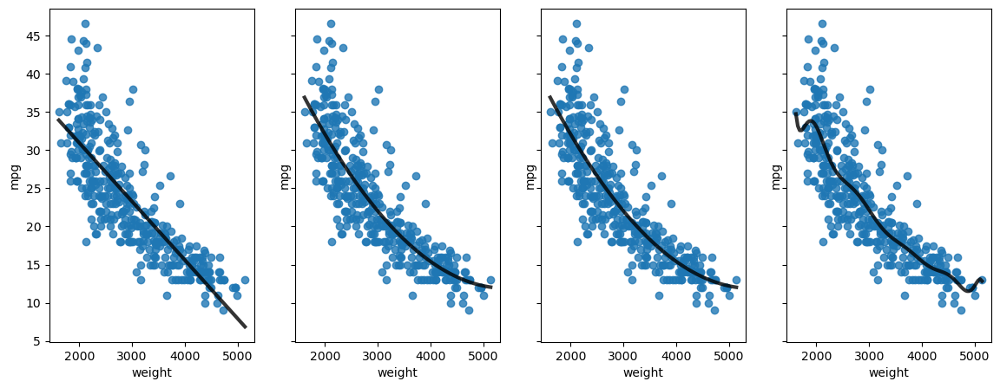

In [42]:
# Plotting 6 degrees of regression trend lines using subplot and regplot

# linear vs polynomial trend line
fig, axs = plt.subplots(ncols=4, sharex=True, sharey=True, figsize=(14,5))
sns.regplot(x='weight',y='mpg', data=cars_df, ci=None, order=1, line_kws={'color':'k','alpha':0.8,'lw':3}, ax=axs[0])
sns.regplot(x='weight',y='mpg', data=cars_df, ci=None, order=2, line_kws={'color':'k','alpha':0.8,'lw':3}, ax=axs[1])
sns.regplot(x='weight',y='mpg', data=cars_df, ci=None, order=3, line_kws={'color':'k','alpha':0.8,'lw':3}, ax=axs[2])
sns.regplot(x='weight',y='mpg', data=cars_df, ci=None, order=12, line_kws={'color':'k','alpha':0.8,'lw':3}, ax=axs[3])

In [43]:
# model: polynom with 2 degrees
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(degree=2)

X_poly = poly.fit_transform(X_train_scaled)
poly.fit(X_poly, y_train_scaled)

pol_lin_reg = LinearRegression()
pol_lin_reg.fit(X_poly, y_train_scaled)

# predict
y_train_pred_scaled = pol_lin_reg.predict(X_poly)
y_train_pred = y_train_scaler.inverse_transform(y_train_pred_scaled)

y_train_pred = round(pd.Series(y_train_pred[:,0], index=y_train.index, name='predicted_mpg'), ndigits=2)

train_df = pd.merge(left=train_df, right=y_train_pred, left_index=True, right_index=True)

train_df.head()

,weight,mpg,predicted_mpg
42,4955,12.0,12.26
0,3504,18.0,18.12
198,1795,33.0,34.93
370,2575,31.0,25.93
227,3630,19.0,17.31


In [53]:
# plot the model

fig = go.Figure()
fig.add_trace(go.Scatter(y=train_df.mpg, x=train_df.weight, mode='markers', marker_color='green', marker_size=4, name='Actual mpg'))
fig.add_trace(go.Scatter(y=test_df.mpg, x=test_df.weight, mode='markers', marker_color='orange', marker_size=4, name='Actual mpg'))
fig.add_trace(go.Scatter(y=train_df.predicted_mpg, x=train_df.weight, mode='markers', marker_color='red', marker_size=4, name='Predicted mpg'))
fig.show()